## Imports

In [1]:
import sys

sys.path.append('/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_epithelium_db/src')

In [2]:
import os
import cv2
import json
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from posprocesing.feature_extraction import nuclei_feature_extraction

## Load images and masks

In [3]:
src_folder_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/Lady'

with open('/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_epithelium_db/src/config.json', 'r') as config_file:
        config = json.load(config_file)

PATH_TO_MASKS = os.path.join(src_folder_path,'new_masks')
PATH_TO_IMAGE = os.path.join(src_folder_path,'patches')

images_name = os.listdir(PATH_TO_IMAGE)

# Create dictionary to save nuclei data
nuclei_data = {}

# Load images and masks and extract nuclei features
for image_name in tqdm(images_name):
    image = cv2.imread(os.path.join(PATH_TO_IMAGE, image_name))
    mask = cv2.imread(os.path.join(PATH_TO_MASKS, image_name))
    mask = mask[:,:,config['channel_nuclei']]
    nuclei_data[image_name] = nuclei_feature_extraction(image, mask)

100%|███████████████████████████████████████| 1664/1664 [06:45<00:00,  4.10it/s]


## Calculate features for each nucleus of every image

In [3]:
from scipy.stats import entropy

def R(intensity_levels):
    norm_var = intensity_levels.var()/(255**2)
    return 1-1/(1+norm_var)

def U(p_intensity):
    return np.sum(p_intensity[0]**2)

def E(p_intensity):
    return entropy(p_intensity[0], base=2)    
    

In [4]:
nuclei_data = {}

'''
cv2.findContours parameters:
    mode -> cv2.RETR_EXTERNAL: retrieves only the extreme outer contours.
    method -> cv2.CHAIN_APPROX_SIMPLE: compresses horizontal, vertical, and diagonal segments and leaves only their end points.
'''

for i in tqdm(range(len(images))):

    # 1. Separate all nuclei instances in an image and calculate statistics.
    num_labels, nuclei_instances, stats, centroids = cv2.connectedComponentsWithStats(masks[i])

    contours = []
    perimeters = []
    areas = []
    circularity = []
    intensity = []
    texture_R = []
    texture_U = []
    texture_E = []
    gray_image = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)

    # 2. Iterate over each nucleus of an image and calculate features.
    for j in range(1,num_labels):

        nuclei_mask = ((nuclei_instances==j)*255).astype('uint8')
        output = cv2.findContours(image=nuclei_mask, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)
        perimeter = cv2.arcLength(output[0][0],1)
        area = cv2.contourArea(output[0][0])
        contours.append(output[0][0])
        perimeters.append(perimeter)
        areas.append(area)
        intensity_levels = gray_image[nuclei_instances==j]
        intensity.append(intensity_levels.mean())
        if (perimeter**2!=0):
            circularity.append((np.pi*4*area)/(perimeter**2))
        else:
            # append circularity value of -1 for nuclei with perimeter^2=0
            circularity.append(-1)


        # 3. Calculate the probability density function of the intensity levels in the nucleus in order to calculate different metrics 
        # regarding nucleus texture
        p_intensity = np.histogram(intensity_levels, bins=np.arange(intensity_levels.min(), intensity_levels.max()+2), density=True)
        texture_R.append(R(intensity_levels))
        texture_U.append(U(p_intensity))
        texture_E.append(E(p_intensity))

    # 4. Save data of all nuclei in an image in a dictionary.
    nuclei_data[str(i)]={'contours':contours, 'perimeters': perimeters, 'areas':areas, 'circularity':circularity, 
                                       'intensity':intensity, 'texture_R': texture_R, 'texture_U': texture_U, 'texture_E': texture_E}


100%|█████████████████████████████████████████| 100/100 [00:55<00:00,  1.81it/s]


## See nuclei segmentation

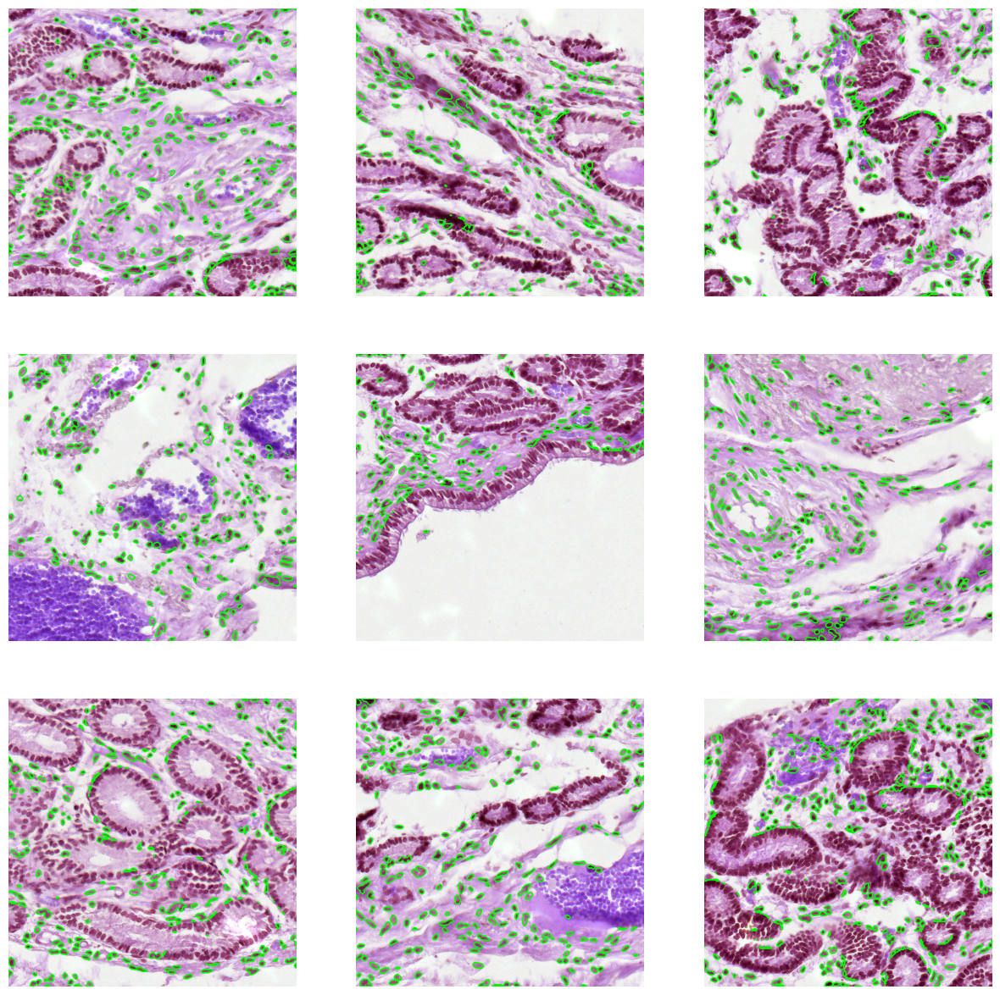

In [5]:
fig = plt.figure(figsize=(15,15))
random_images = np.random.randint(0,len(images)-1,9)

for i in range(len(random_images)):
    fig.add_subplot(3, 3, i+1)
    plt.imshow(cv2.drawContours(images[random_images[i]].copy(), nuclei_data[str(random_images[i])]['contours'], -1, (0,255,0), 3))
    plt.axis('off')

## Plot histograms

In [6]:
def plot_histogram (list, variable_name):
    fig = go.Figure(data=[go.Histogram(x=list)])

    fig.update_layout(
        title_text='Histogram of ' + variable_name, # title of plot
        xaxis_title_text=variable_name, # xaxis label
        yaxis_title_text='Count', # yaxis label
    )
    fig.show()

In [4]:
perimeters_list = []
area_list = []
circularity_list = []
intensity_list = []
texture_R_list = []
texture_U_list = []
texture_E_list = []

for key in nuclei_data.keys():
    perimeters_list += nuclei_data[key]['perimeters']
    area_list += nuclei_data[key]['areas']
    circularity_list += nuclei_data[key]['circularity']
    intensity_list += nuclei_data[key]['intensity']
    texture_R_list += nuclei_data[key]['texture_R']
    texture_U_list += nuclei_data[key]['texture_U']
    texture_E_list += nuclei_data[key]['texture_E']

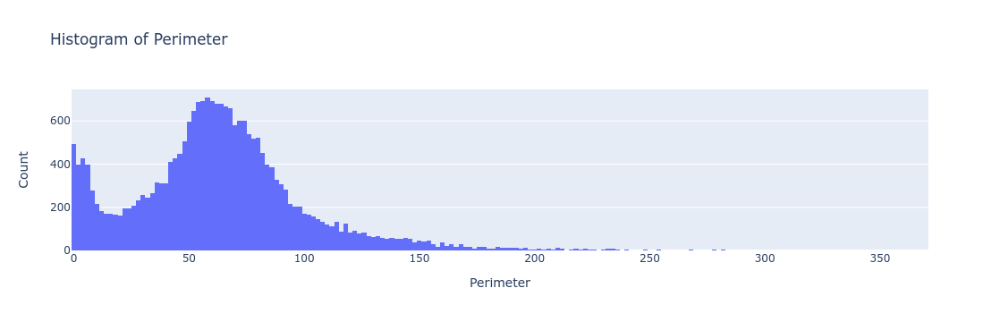

In [8]:
plot_histogram (perimeters_list, 'Perimeter')

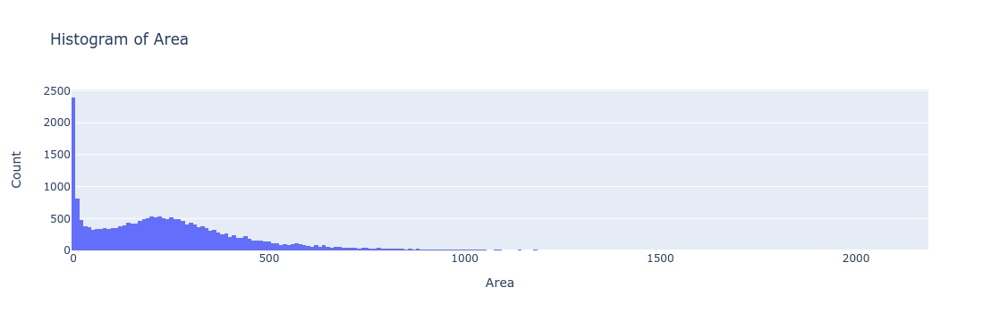

In [9]:
plot_histogram (area_list, 'Area')

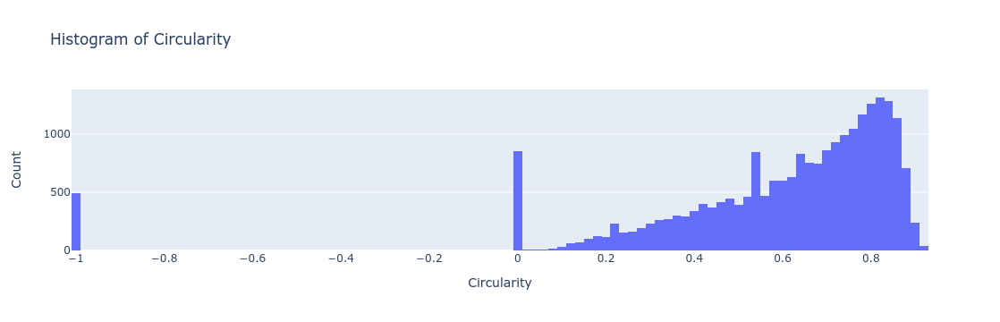

In [10]:
plot_histogram (circularity_list, 'Circularity')

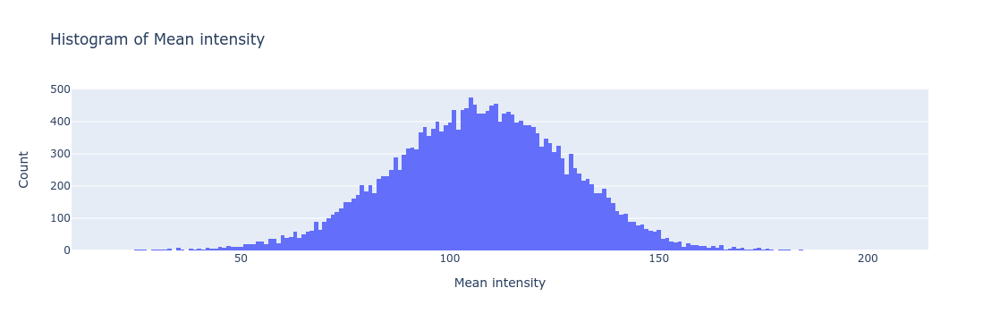

In [11]:
plot_histogram (intensity_list, 'Mean intensity')

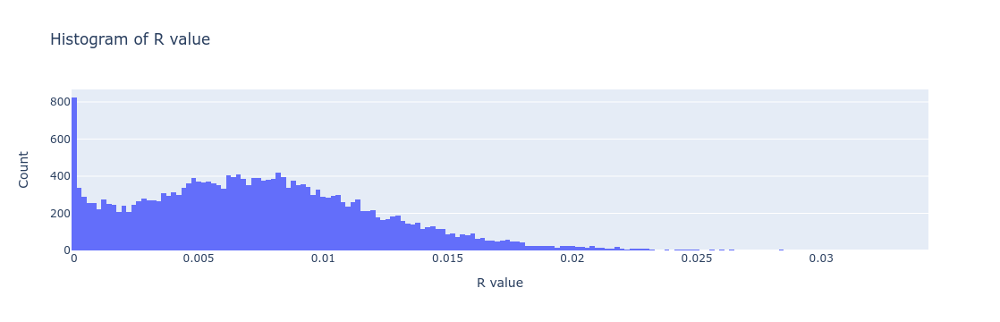

In [12]:
plot_histogram (texture_R_list, 'R value')

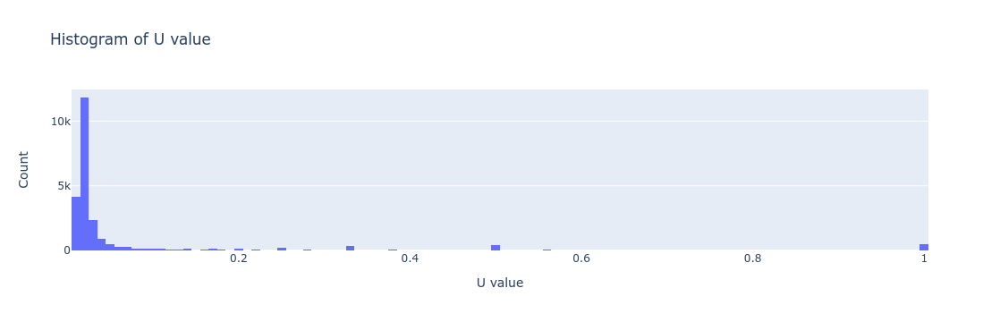

In [13]:
plot_histogram (texture_U_list, 'U value')

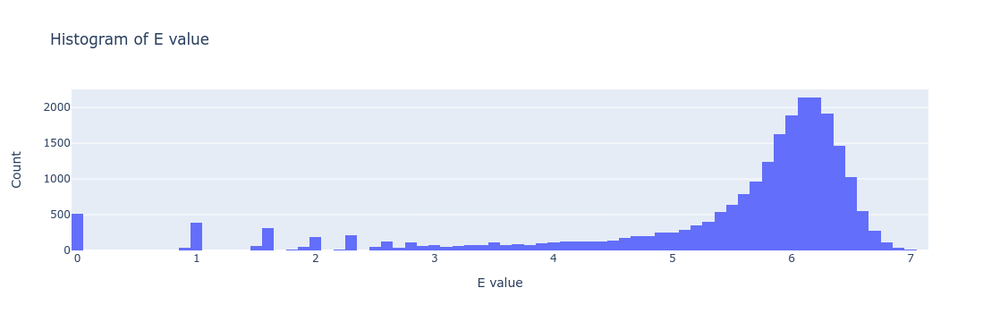

In [14]:
plot_histogram (texture_E_list, 'E value')

## See if nuclei with circularity above a certain threshold are more likely to be lymphocytes

In [32]:
# Select the nuclei with circularity over the 90th% percentile of circularities distribution
selected_image_index = np.random.randint(0,len(nuclei_data.keys())-1)
percentile = 95

high_circularity_nuclei = nuclei_data[images_name[selected_image_index]]['circularity']>np.percentile(circularity_list,percentile) 
contours_high_circularity_nuclei = [nuclei_data[images_name[selected_image_index]]['contours'][i] for i in range(len(high_circularity_nuclei)) if high_circularity_nuclei[i]==True]

image = cv2.imread(os.path.join(PATH_TO_IMAGE, images_name[selected_image_index])) 
mask = cv2.imread(os.path.join(PATH_TO_MASKS, images_name[selected_image_index])) 
channels_to_change = [i for i in range(3) if i!=config['channel_nuclei']]

mask[:,:,channels_to_change[0]] = mask[:,:,config['channel_nuclei']]
mask[:,:,channels_to_change[1]] = mask[:,:,config['channel_nuclei']]

mask_image = image.copy()
selected_image = image.copy()
cv2.drawContours(selected_image, contours_high_circularity_nuclei, -1, (0,255,0), 3)
mask_image = cv2.addWeighted(cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB),0.7,mask,0.7,0)

# print
# img_h_concat = cv2.hconcat([image, selected_image])
# cv2.imshow('image and high circularity image',img_h_concat)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

# save
high_circularity_path = '/home/sofia/Documents/FING/Proyecto/clasificacion_de_nucleos/nuclei_classification/high_circularity_nuclei'
image_path = os.path.join(high_circularity_path, images_name[selected_image_index])
selected_image_path = os.path.join(high_circularity_path, images_name[selected_image_index][:-4]+'_linfo.png')
mask_image_path = os.path.join(high_circularity_path, images_name[selected_image_index][:-4]+'_mask.png')
cv2.imwrite(image_path, image)
cv2.imwrite(mask_image_path, mask_image)
cv2.imwrite(selected_image_path, selected_image)



True